# Proyecto Viz

In [1]:
import folium
from folium import plugins
from folium.plugins import HeatMapWithTime as HMWT
from folium.plugins import HeatMap as HM

import pandas as pd
import numpy as np

import warnings
warnings.filterwarnings('ignore')  # esto es para quitar prints

pd.set_option('display.max_columns', None)   # mostrar todas las columnas del df
#pd.set_option('display.max_rows', None)   # mostrar todas las filas del df

import regex as re

# para pintar
import pylab as plt
import seaborn as sns

In [2]:
df_densidad = pd.read_csv('../data/densidad.csv')
df_demographics = pd.read_csv('../data/demographics.csv')
df_accidentes = pd.read_csv('../data/accidentes.csv')


In [3]:
df_densidad.rename(columns={'id_distrito':'cod_distrito'}, inplace=True)

In [4]:
df_demographics.rename(columns={'id_distrito':'cod_distrito'}, inplace=True)

In [5]:
#hago el merge para las tres tablas de una vez
import functools as ft
dfs = [df_accidentes, df_densidad, df_demographics]
accidentes = ft.reduce(lambda left, right: pd.merge(left, right, on='cod_distrito'), dfs)

In [6]:
accidentes.head()

,id,num_expediente,fecha,hora,localizacion,numero,cod_distrito,distrito,tipo_accidente,estado_meteorológico,tipo_vehiculo,tipo_persona,rango_edad,sexo,lesividad,positivo_droga,positivo_alcohol,ano,mes,dia,long,lat,nombre_distrito,densidad_pob,edad_media,pob_men_18_perc,pob_may_65_perc,pob_adulta_perc
0,0,2018S017842,2019-02-04,09:10:00,"CALL. ALBERTO AGUILERA, 1",1,1,CENTRO,Colisión lateral,Despejado,Motocicleta > 125cc,Conductor,De 45 a 49 años,Hombre,Asistencia sanitaria sólo en el lugar del acci...,0,0,2019,2,4,-3.706555,40.429592,Centro,252.34,43.5,8.5,15.8,75.7
1,1,2018S017842,2019-02-04,09:10:00,"CALL. ALBERTO AGUILERA, 1",1,1,CENTRO,Colisión lateral,Despejado,Turismo,Conductor,De 30 a 34 años,Mujer,Asistencia sanitaria sólo en el lugar del acci...,0,0,2019,2,4,-3.706555,40.429592,Centro,252.34,43.5,8.5,15.8,75.7
2,207,2019S000349,2019-01-06,01:34:00,CUSTA. SAN VICENTE / CALL. BAILEN,1,1,CENTRO,Colisión lateral,Despejado,Turismo,Conductor,De 40 a 44 años,Hombre,unknown,0,0,2019,1,6,-3.721464,40.418879,Centro,252.34,43.5,8.5,15.8,75.7
3,208,2019S000349,2019-01-06,01:34:00,CUSTA. SAN VICENTE / CALL. BAILEN,1,1,CENTRO,Colisión lateral,Despejado,Turismo,Conductor,De 50 a 54 años,Mujer,unknown,1,0,2019,1,6,-3.721464,40.418879,Centro,252.34,43.5,8.5,15.8,75.7
4,256,2019S000480,2019-01-05,01:20:00,PLAZA. COLON / CALL. JORGE JUAN,1,1,CENTRO,Colisión fronto-lateral,Despejado,Turismo,Conductor,De 21 a 24 años,Mujer,unknown,0,0,2019,1,5,-3.690424,40.424641,Centro,252.34,43.5,8.5,15.8,75.7


In [7]:
accidentes.reset_index(drop=True, inplace=True)
accidentes.tail()

,id,num_expediente,fecha,hora,localizacion,numero,cod_distrito,distrito,tipo_accidente,estado_meteorológico,tipo_vehiculo,tipo_persona,rango_edad,sexo,lesividad,positivo_droga,positivo_alcohol,ano,mes,dia,long,lat,nombre_distrito,densidad_pob,edad_media,pob_men_18_perc,pob_may_65_perc,pob_adulta_perc
159983,159859,2022S028384,2022-09-30,12:35:00,CALL. EMILIO MUÑOZ / CALL. ZALDIVAR,35,20,SAN BLAS-CANILLEJAS,Colisión fronto-lateral,Despejado,Motocicleta hasta 125cc,Conductor,De 40 a 44 años,Hombre,Asistencia sanitaria inmediata en centro de sa...,0,0,2022,9,30,-3.626787,40.432396,San Blas-Canillejas,69.24,43.0,16.8,17.4,65.8
159984,159860,2022S028384,2022-09-30,12:35:00,CALL. EMILIO MUÑOZ / CALL. ZALDIVAR,35,20,SAN BLAS-CANILLEJAS,Colisión fronto-lateral,Despejado,Turismo,Conductor,Más de 74 años,Hombre,Sin asistencia sanitaria,0,0,2022,9,30,-3.626787,40.432396,San Blas-Canillejas,69.24,43.0,16.8,17.4,65.8
159985,159956,2022S028483,2022-09-30,23:50:00,CALL. ALCALA / CALL. ALEGRIA DE ORIA,491,20,SAN BLAS-CANILLEJAS,Colisión frontal,Despejado,Motocicleta > 125cc,Conductor,De 25 a 29 años,Hombre,Ingreso inferior o igual a 24 horas,0,0,2022,9,30,-3.630571,40.439939,San Blas-Canillejas,69.24,43.0,16.8,17.4,65.8
159986,159957,2022S028483,2022-09-30,23:50:00,CALL. ALCALA / CALL. ALEGRIA DE ORIA,491,20,SAN BLAS-CANILLEJAS,Colisión frontal,Despejado,Motocicleta > 125cc,Pasajero,De 25 a 29 años,Mujer,Ingreso inferior o igual a 24 horas,0,0,2022,9,30,-3.630571,40.439939,San Blas-Canillejas,69.24,43.0,16.8,17.4,65.8
159987,159958,2022S028483,2022-09-30,23:50:00,CALL. ALCALA / CALL. ALEGRIA DE ORIA,491,20,SAN BLAS-CANILLEJAS,Colisión frontal,Despejado,Turismo,Conductor,De 60 a 64 años,Hombre,Sin asistencia sanitaria,0,0,2022,9,30,-3.630571,40.439939,San Blas-Canillejas,69.24,43.0,16.8,17.4,65.8


In [8]:
# heatmap de accidentes 2019-22

mapa_calor=folium.Map([40.416729, -3.703339], zoom_start=10)

data=accidentes[['lat', 'long']].values

mapa_calor.add_child(plugins.HeatMap(data, radius=10))

mapa_calor

In [9]:
#defino lista de meses para los que quiero hacer un heatmap 
df_month_list = []
for month in accidentes.mes.sort_values().unique():
    df_month_list.append(accidentes.loc[accidentes.mes == month, 
                                    ['lat', 
                                     'long', 
                                     'mes']].groupby(['lat', 
                                                        'long']).sum().reset_index().values.tolist())

In [10]:
#función para generar mapa base centrado sobre mi zona de estudio
def generateBaseMap(default_location=[40.416729, -3.703339], default_zoom_start=11):
    
    base_map = folium.Map(location=default_location, 
                          control_scale=True, 
                          zoom_start=default_zoom_start)
    
    return base_map

In [11]:
#genero un heatmap dinámico por meses
base_map = generateBaseMap(default_zoom_start=11) # crea mapa

HMWT(df_month_list, 
     radius=5, 
     gradient={0.2: 'blue', 0.4: 'lime', 0.6: 'orange', 1: 'red'}, 
     min_opacity=0.5, 
     max_opacity=0.8, 
     use_local_extrema=True).add_to(base_map) # datos pata heatmap con tiempo


base_map  # representa

In [12]:
base_map.save('../img/mapa.mp4') # guarda el heatmap en mp4

### Correlación entre campos del dataframe

In [13]:
plt.rcParams['figure.figsize']=(20, 10)

In [14]:
corr=accidentes.corr(method='pearson')

corr

,id,cod_distrito,positivo_droga,positivo_alcohol,ano,mes,dia,long,lat,densidad_pob,edad_media,pob_men_18_perc,pob_may_65_perc,pob_adulta_perc
id,1.000000,0.001724,-0.004371,0.014479,0.964195,0.128170,0.021135,-0.006166,-0.008856,-0.008278,-0.007376,0.006040,-0.007386,0.002300
cod_distrito,0.001724,1.000000,0.011883,0.018955,0.005260,-0.014090,-0.004206,0.516425,-0.135479,-0.630623,-0.500331,0.659034,-0.417754,-0.120756
positivo_droga,-0.004371,0.011883,1.000000,0.070959,-0.003493,-0.005870,-0.000748,0.008141,-0.015174,-0.009459,-0.015824,0.008969,-0.015953,0.008190
positivo_alcohol,0.014479,0.018955,0.070959,1.000000,0.013881,0.004248,0.000763,-0.014996,-0.022744,-0.008011,-0.014536,0.008560,-0.016741,0.009269
ano,0.964195,0.005260,-0.003493,0.013881,1.000000,-0.129037,-0.003061,-0.006518,-0.010166,-0.011595,-0.010919,0.009100,-0.010410,0.002778
mes,0.128170,-0.014090,-0.005870,0.004248,-0.129037,1.000000,0.007417,0.003000,0.001524,0.014726,0.013162,-0.012720,0.010296,0.000192
dia,0.021135,-0.004206,-0.000748,0.000763,-0.003061,0.007417,1.000000,-0.011098,0.006106,0.002730,0.015495,-0.007322,0.015664,-0.009215
long,-0.006166,0.516425,0.008141,-0.014996,-0.006518,0.003000,-0.011098,1.000000,0.141200,-0.182851,-0.251905,0.302880,-0.246631,-0.003167
lat,-0.008856,-0.135479,-0.015174,-0.022744,-0.010166,0.001524,0.006106,0.141200,1.000000,-0.093439,0.155819,0.081655,0.300230,-0.352077
densidad_pob,-0.008278,-0.630623,-0.009459,-0.008011,-0.011595,0.014726,0.002730,-0.182851,-0.093439,1.000000,0.524785,-0.832527,0.294729,0.375699


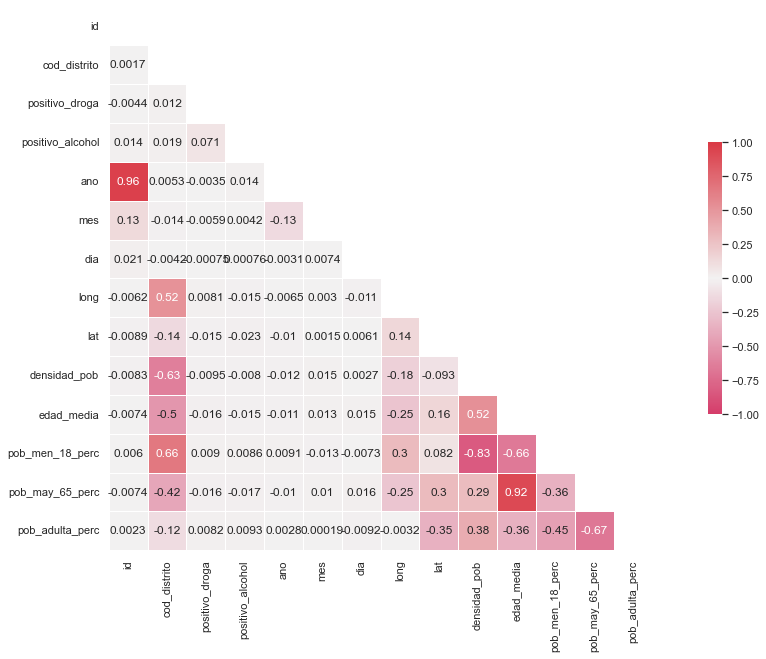

In [15]:
sns.set(style='white')    # estilo blanco

mascara=np.triu(np.ones_like(corr, dtype=bool))   # genera una mascara

cmap=sns.diverging_palette(0, 10, as_cmap=True)   # paleta de colores


sns.heatmap(corr,
            mask=mascara,
            cmap=cmap,
            vmax=1,
            vmin=-1,
            center=0,
            square=True,
            linewidth=0.5,
            cbar_kws={'shrink': 0.5},
            annot=True
           );

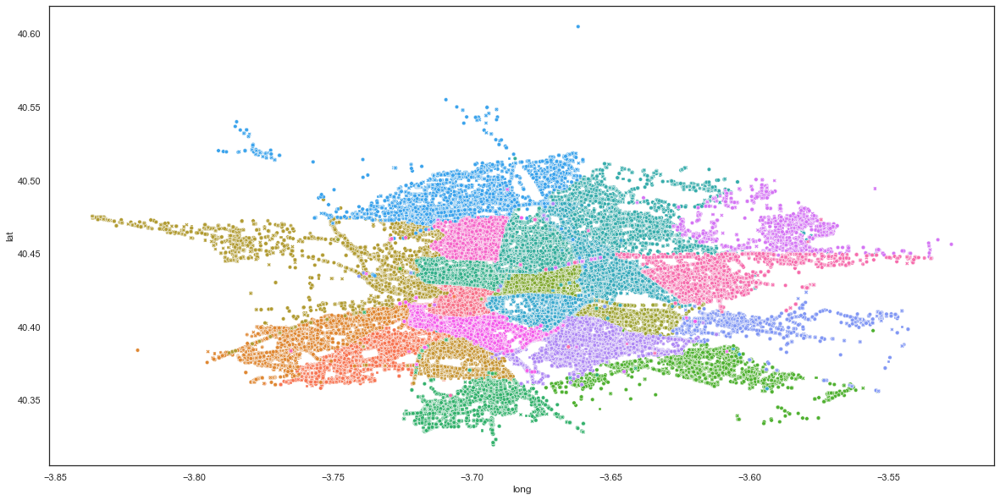

In [16]:
# Mapa de accidentes, color por distrito
sns.scatterplot(x='long', y='lat', data=accidentes, hue='distrito', legend=False, s=20, style='sexo')
plt.show()

In [17]:
accidentes.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 159988 entries, 0 to 159987
Data columns (total 28 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   id                    159988 non-null  int64  
 1   num_expediente        159988 non-null  object 
 2   fecha                 159988 non-null  object 
 3   hora                  159988 non-null  object 
 4   localizacion          159988 non-null  object 
 5   numero                159988 non-null  object 
 6   cod_distrito          159988 non-null  int64  
 7   distrito              159988 non-null  object 
 8   tipo_accidente        159988 non-null  object 
 9   estado_meteorológico  159988 non-null  object 
 10  tipo_vehiculo         159988 non-null  object 
 11  tipo_persona          159988 non-null  object 
 12  rango_edad            159988 non-null  object 
 13  sexo                  159988 non-null  object 
 14  lesividad             159988 non-null  object 
 15  

In [18]:
accidentes.lesividad.value_counts()

unknown                                                      71571
Sin asistencia sanitaria                                     48298
Asistencia sanitaria sólo en el lugar del accidente          21159
Ingreso inferior o igual a 24 horas                           6314
Atención en urgencias sin posterior ingreso                   4560
Asistencia sanitaria inmediata en centro de salud o mutua     4108
Asistencia sanitaria ambulatoria con posterioridad            2008
Ingreso superior a 24 horas                                   1853
Fallecido 24 horas                                             111
Se desconoce                                                     6
Name: lesividad, dtype: int64

In [ ]:
#### Para hacer un mapa dinámico de concentración de accidentes por hora del día, vamos 

In [19]:
accidentes['fecha_str']=accidentes['fecha'].astype(str)
accidentes.head()

,id,num_expediente,fecha,hora,localizacion,numero,cod_distrito,distrito,tipo_accidente,estado_meteorológico,tipo_vehiculo,tipo_persona,rango_edad,sexo,lesividad,positivo_droga,positivo_alcohol,ano,mes,dia,long,lat,nombre_distrito,densidad_pob,edad_media,pob_men_18_perc,pob_may_65_perc,pob_adulta_perc,fecha_str
0,0,2018S017842,2019-02-04,09:10:00,"CALL. ALBERTO AGUILERA, 1",1,1,CENTRO,Colisión lateral,Despejado,Motocicleta > 125cc,Conductor,De 45 a 49 años,Hombre,Asistencia sanitaria sólo en el lugar del acci...,0,0,2019,2,4,-3.706555,40.429592,Centro,252.34,43.5,8.5,15.8,75.7,2019-02-04
1,1,2018S017842,2019-02-04,09:10:00,"CALL. ALBERTO AGUILERA, 1",1,1,CENTRO,Colisión lateral,Despejado,Turismo,Conductor,De 30 a 34 años,Mujer,Asistencia sanitaria sólo en el lugar del acci...,0,0,2019,2,4,-3.706555,40.429592,Centro,252.34,43.5,8.5,15.8,75.7,2019-02-04
2,207,2019S000349,2019-01-06,01:34:00,CUSTA. SAN VICENTE / CALL. BAILEN,1,1,CENTRO,Colisión lateral,Despejado,Turismo,Conductor,De 40 a 44 años,Hombre,unknown,0,0,2019,1,6,-3.721464,40.418879,Centro,252.34,43.5,8.5,15.8,75.7,2019-01-06
3,208,2019S000349,2019-01-06,01:34:00,CUSTA. SAN VICENTE / CALL. BAILEN,1,1,CENTRO,Colisión lateral,Despejado,Turismo,Conductor,De 50 a 54 años,Mujer,unknown,1,0,2019,1,6,-3.721464,40.418879,Centro,252.34,43.5,8.5,15.8,75.7,2019-01-06
4,256,2019S000480,2019-01-05,01:20:00,PLAZA. COLON / CALL. JORGE JUAN,1,1,CENTRO,Colisión fronto-lateral,Despejado,Turismo,Conductor,De 21 a 24 años,Mujer,unknown,0,0,2019,1,5,-3.690424,40.424641,Centro,252.34,43.5,8.5,15.8,75.7,2019-01-05


In [20]:
accidentes['fecha_completa']= accidentes['fecha_str'] + ' ' + accidentes['hora']
accidentes.head()

,id,num_expediente,fecha,hora,localizacion,numero,cod_distrito,distrito,tipo_accidente,estado_meteorológico,tipo_vehiculo,tipo_persona,rango_edad,sexo,lesividad,positivo_droga,positivo_alcohol,ano,mes,dia,long,lat,nombre_distrito,densidad_pob,edad_media,pob_men_18_perc,pob_may_65_perc,pob_adulta_perc,fecha_str,fecha_completa
0,0,2018S017842,2019-02-04,09:10:00,"CALL. ALBERTO AGUILERA, 1",1,1,CENTRO,Colisión lateral,Despejado,Motocicleta > 125cc,Conductor,De 45 a 49 años,Hombre,Asistencia sanitaria sólo en el lugar del acci...,0,0,2019,2,4,-3.706555,40.429592,Centro,252.34,43.5,8.5,15.8,75.7,2019-02-04,2019-02-04 09:10:00
1,1,2018S017842,2019-02-04,09:10:00,"CALL. ALBERTO AGUILERA, 1",1,1,CENTRO,Colisión lateral,Despejado,Turismo,Conductor,De 30 a 34 años,Mujer,Asistencia sanitaria sólo en el lugar del acci...,0,0,2019,2,4,-3.706555,40.429592,Centro,252.34,43.5,8.5,15.8,75.7,2019-02-04,2019-02-04 09:10:00
2,207,2019S000349,2019-01-06,01:34:00,CUSTA. SAN VICENTE / CALL. BAILEN,1,1,CENTRO,Colisión lateral,Despejado,Turismo,Conductor,De 40 a 44 años,Hombre,unknown,0,0,2019,1,6,-3.721464,40.418879,Centro,252.34,43.5,8.5,15.8,75.7,2019-01-06,2019-01-06 01:34:00
3,208,2019S000349,2019-01-06,01:34:00,CUSTA. SAN VICENTE / CALL. BAILEN,1,1,CENTRO,Colisión lateral,Despejado,Turismo,Conductor,De 50 a 54 años,Mujer,unknown,1,0,2019,1,6,-3.721464,40.418879,Centro,252.34,43.5,8.5,15.8,75.7,2019-01-06,2019-01-06 01:34:00
4,256,2019S000480,2019-01-05,01:20:00,PLAZA. COLON / CALL. JORGE JUAN,1,1,CENTRO,Colisión fronto-lateral,Despejado,Turismo,Conductor,De 21 a 24 años,Mujer,unknown,0,0,2019,1,5,-3.690424,40.424641,Centro,252.34,43.5,8.5,15.8,75.7,2019-01-05,2019-01-05 01:20:00


In [21]:
accidentes.fecha_completa=pd.to_datetime(accidentes.fecha_completa)

accidentes.head()

,id,num_expediente,fecha,hora,localizacion,numero,cod_distrito,distrito,tipo_accidente,estado_meteorológico,tipo_vehiculo,tipo_persona,rango_edad,sexo,lesividad,positivo_droga,positivo_alcohol,ano,mes,dia,long,lat,nombre_distrito,densidad_pob,edad_media,pob_men_18_perc,pob_may_65_perc,pob_adulta_perc,fecha_str,fecha_completa
0,0,2018S017842,2019-02-04,09:10:00,"CALL. ALBERTO AGUILERA, 1",1,1,CENTRO,Colisión lateral,Despejado,Motocicleta > 125cc,Conductor,De 45 a 49 años,Hombre,Asistencia sanitaria sólo en el lugar del acci...,0,0,2019,2,4,-3.706555,40.429592,Centro,252.34,43.5,8.5,15.8,75.7,2019-02-04,2019-02-04 09:10:00
1,1,2018S017842,2019-02-04,09:10:00,"CALL. ALBERTO AGUILERA, 1",1,1,CENTRO,Colisión lateral,Despejado,Turismo,Conductor,De 30 a 34 años,Mujer,Asistencia sanitaria sólo en el lugar del acci...,0,0,2019,2,4,-3.706555,40.429592,Centro,252.34,43.5,8.5,15.8,75.7,2019-02-04,2019-02-04 09:10:00
2,207,2019S000349,2019-01-06,01:34:00,CUSTA. SAN VICENTE / CALL. BAILEN,1,1,CENTRO,Colisión lateral,Despejado,Turismo,Conductor,De 40 a 44 años,Hombre,unknown,0,0,2019,1,6,-3.721464,40.418879,Centro,252.34,43.5,8.5,15.8,75.7,2019-01-06,2019-01-06 01:34:00
3,208,2019S000349,2019-01-06,01:34:00,CUSTA. SAN VICENTE / CALL. BAILEN,1,1,CENTRO,Colisión lateral,Despejado,Turismo,Conductor,De 50 a 54 años,Mujer,unknown,1,0,2019,1,6,-3.721464,40.418879,Centro,252.34,43.5,8.5,15.8,75.7,2019-01-06,2019-01-06 01:34:00
4,256,2019S000480,2019-01-05,01:20:00,PLAZA. COLON / CALL. JORGE JUAN,1,1,CENTRO,Colisión fronto-lateral,Despejado,Turismo,Conductor,De 21 a 24 años,Mujer,unknown,0,0,2019,1,5,-3.690424,40.424641,Centro,252.34,43.5,8.5,15.8,75.7,2019-01-05,2019-01-05 01:20:00


In [22]:
accidentes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 159988 entries, 0 to 159987
Data columns (total 30 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   id                    159988 non-null  int64         
 1   num_expediente        159988 non-null  object        
 2   fecha                 159988 non-null  object        
 3   hora                  159988 non-null  object        
 4   localizacion          159988 non-null  object        
 5   numero                159988 non-null  object        
 6   cod_distrito          159988 non-null  int64         
 7   distrito              159988 non-null  object        
 8   tipo_accidente        159988 non-null  object        
 9   estado_meteorológico  159988 non-null  object        
 10  tipo_vehiculo         159988 non-null  object        
 11  tipo_persona          159988 non-null  object        
 12  rango_edad            159988 non-null  object        
 13 

In [23]:
#elimino la columna fecha_str
accidentes.drop('fecha_str', axis=1, inplace=True) 

In [24]:
accidentes.head()

,id,num_expediente,fecha,hora,localizacion,numero,cod_distrito,distrito,tipo_accidente,estado_meteorológico,tipo_vehiculo,tipo_persona,rango_edad,sexo,lesividad,positivo_droga,positivo_alcohol,ano,mes,dia,long,lat,nombre_distrito,densidad_pob,edad_media,pob_men_18_perc,pob_may_65_perc,pob_adulta_perc,fecha_completa
0,0,2018S017842,2019-02-04,09:10:00,"CALL. ALBERTO AGUILERA, 1",1,1,CENTRO,Colisión lateral,Despejado,Motocicleta > 125cc,Conductor,De 45 a 49 años,Hombre,Asistencia sanitaria sólo en el lugar del acci...,0,0,2019,2,4,-3.706555,40.429592,Centro,252.34,43.5,8.5,15.8,75.7,2019-02-04 09:10:00
1,1,2018S017842,2019-02-04,09:10:00,"CALL. ALBERTO AGUILERA, 1",1,1,CENTRO,Colisión lateral,Despejado,Turismo,Conductor,De 30 a 34 años,Mujer,Asistencia sanitaria sólo en el lugar del acci...,0,0,2019,2,4,-3.706555,40.429592,Centro,252.34,43.5,8.5,15.8,75.7,2019-02-04 09:10:00
2,207,2019S000349,2019-01-06,01:34:00,CUSTA. SAN VICENTE / CALL. BAILEN,1,1,CENTRO,Colisión lateral,Despejado,Turismo,Conductor,De 40 a 44 años,Hombre,unknown,0,0,2019,1,6,-3.721464,40.418879,Centro,252.34,43.5,8.5,15.8,75.7,2019-01-06 01:34:00
3,208,2019S000349,2019-01-06,01:34:00,CUSTA. SAN VICENTE / CALL. BAILEN,1,1,CENTRO,Colisión lateral,Despejado,Turismo,Conductor,De 50 a 54 años,Mujer,unknown,1,0,2019,1,6,-3.721464,40.418879,Centro,252.34,43.5,8.5,15.8,75.7,2019-01-06 01:34:00
4,256,2019S000480,2019-01-05,01:20:00,PLAZA. COLON / CALL. JORGE JUAN,1,1,CENTRO,Colisión fronto-lateral,Despejado,Turismo,Conductor,De 21 a 24 años,Mujer,unknown,0,0,2019,1,5,-3.690424,40.424641,Centro,252.34,43.5,8.5,15.8,75.7,2019-01-05 01:20:00


In [26]:
# transformar segun datos de tiempo

accidentes.fecha_completa = pd.to_datetime(accidentes.fecha_completa, format='%Y-%m-%d %H:%M:%S')

accidentes['hora_'] = accidentes.fecha_completa.apply(lambda x: x.hour)

In [32]:
accidentes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 159988 entries, 0 to 159987
Data columns (total 30 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   id                    159988 non-null  int64         
 1   num_expediente        159988 non-null  object        
 2   fecha                 159988 non-null  object        
 3   hora                  159988 non-null  object        
 4   localizacion          159988 non-null  object        
 5   numero                159988 non-null  object        
 6   cod_distrito          159988 non-null  int64         
 7   distrito              159988 non-null  object        
 8   tipo_accidente        159988 non-null  object        
 9   estado_meteorológico  159988 non-null  object        
 10  tipo_vehiculo         159988 non-null  object        
 11  tipo_persona          159988 non-null  object        
 12  rango_edad            159988 non-null  object        
 13 

In [27]:
accidentes.head()

,id,num_expediente,fecha,hora,localizacion,numero,cod_distrito,distrito,tipo_accidente,estado_meteorológico,tipo_vehiculo,tipo_persona,rango_edad,sexo,lesividad,positivo_droga,positivo_alcohol,ano,mes,dia,long,lat,nombre_distrito,densidad_pob,edad_media,pob_men_18_perc,pob_may_65_perc,pob_adulta_perc,fecha_completa,hora_
0,0,2018S017842,2019-02-04,09:10:00,"CALL. ALBERTO AGUILERA, 1",1,1,CENTRO,Colisión lateral,Despejado,Motocicleta > 125cc,Conductor,De 45 a 49 años,Hombre,Asistencia sanitaria sólo en el lugar del acci...,0,0,2019,2,4,-3.706555,40.429592,Centro,252.34,43.5,8.5,15.8,75.7,2019-02-04 09:10:00,9
1,1,2018S017842,2019-02-04,09:10:00,"CALL. ALBERTO AGUILERA, 1",1,1,CENTRO,Colisión lateral,Despejado,Turismo,Conductor,De 30 a 34 años,Mujer,Asistencia sanitaria sólo en el lugar del acci...,0,0,2019,2,4,-3.706555,40.429592,Centro,252.34,43.5,8.5,15.8,75.7,2019-02-04 09:10:00,9
2,207,2019S000349,2019-01-06,01:34:00,CUSTA. SAN VICENTE / CALL. BAILEN,1,1,CENTRO,Colisión lateral,Despejado,Turismo,Conductor,De 40 a 44 años,Hombre,unknown,0,0,2019,1,6,-3.721464,40.418879,Centro,252.34,43.5,8.5,15.8,75.7,2019-01-06 01:34:00,1
3,208,2019S000349,2019-01-06,01:34:00,CUSTA. SAN VICENTE / CALL. BAILEN,1,1,CENTRO,Colisión lateral,Despejado,Turismo,Conductor,De 50 a 54 años,Mujer,unknown,1,0,2019,1,6,-3.721464,40.418879,Centro,252.34,43.5,8.5,15.8,75.7,2019-01-06 01:34:00,1
4,256,2019S000480,2019-01-05,01:20:00,PLAZA. COLON / CALL. JORGE JUAN,1,1,CENTRO,Colisión fronto-lateral,Despejado,Turismo,Conductor,De 21 a 24 años,Mujer,unknown,0,0,2019,1,5,-3.690424,40.424641,Centro,252.34,43.5,8.5,15.8,75.7,2019-01-05 01:20:00,1


In [34]:
df_hour_list = []
for hour in accidentes.hora_.sort_values().unique():
    df_hour_list.append(accidentes.loc[accidentes.hora_ == hour, 
                                    ['lat', 
                                     'long', 
                                     'hora_']].groupby(['lat', 
                                                        'long']).sum().reset_index().values.tolist())

In [37]:
#genero un heatmap dinámico por horas
base_map1 = generateBaseMap(default_zoom_start=11) # crea mapa

HMWT(df_hour_list, 
     radius=5, 
     gradient={0.2: 'blue', 0.4: 'lime', 0.6: 'orange', 1: 'red'}, 
     min_opacity=0.5, 
     max_opacity=0.8, 
     use_local_extrema=True).add_to(base_map1) # datos pata heatmap con tiempo


base_map1  # representa

In [ ]:
base_map1.save('../img/mapa_horas.mp4') # guarda el heatmap en mp4